In [1]:
import numpy as np
import matplotlib.tri as mtri
import matplotlib.pyplot as plt
from math import exp, sqrt, pi

import plotly.graph_objects as go

In [18]:
tri = mtri.Triangulation(PosT[:, 0], PosT[:, 1])

In [ ]:
import matplotlib.tri as mtri
import plotly.graph_objects as go
import numpy as np

# Nuage de points
x = PosT[:, 0]
y = PosT[:, 1]
z = PosT[:, 2]

# Triangulation
tri = mtri.Triangulation(x, y)

# Surface triangulée avec colorbar
fig = go.Figure(data=[go.Mesh3d(
    x=x,
    y=y,
    z=z,
    i=tri.triangles[:, 0],
    j=tri.triangles[:, 1],
    k=tri.triangles[:, 2],
    intensity=z,           # couleurs selon z
    colorscale='Viridis',  # palette,     # palette MATLAB
    cmin=-0.3,            # min colorbar
    cmax=0.3,    
    showscale=True,        # affiche colorbar
    opacity=0.9
)])

fig.update_layout(
    title="Matlab topography - Triangulated Surface",
    width=1200,
    height=900,
    scene=dict(
        xaxis=dict(range=[-600, 600]),
        yaxis=dict(range=[-6000, 6000]),
        zaxis=dict(range=[-0.3, 0.3]),
        aspectmode='manual',
        aspectratio=dict(
            x=(x.max()-x.min())/(y.max()-y.min()),
            y=1,
            z=0.01
        )
    )
)

fig.show()

In [ ]:
import matplotlib.tri as mtri
import plotly.graph_objects as go
import numpy as np

# Nuage de points
x = PosT_python[:, 0]
y = PosT_python[:, 1]
z = PosT_python[:, 2]

# Triangulation
tri = mtri.Triangulation(x, y)

# Surface triangulée avec colorbar
fig = go.Figure(data=[go.Mesh3d(
    x=x,
    y=y,
    z=z,
    i=tri.triangles[:, 0],
    j=tri.triangles[:, 1],
    k=tri.triangles[:, 2],
    intensity=z,           # couleurs selon z
    colorscale='Viridis',  # palette,     # palette MATLAB
    cmin=-0.3,            # min colorbar
    cmax=0.3,    
    showscale=True,        # affiche colorbar
    opacity=0.9
)])

fig.update_layout(
    title="Matlab topography - Triangulated Surface",
    width=1200,
    height=900,
    scene=dict(
        xaxis=dict(range=[-600, 600]),
        yaxis=dict(range=[-6000, 6000]),
        zaxis=dict(range=[-0.3, 0.3]),
        aspectmode='manual',
        aspectratio=dict(
            x=(x.max()-x.min())/(y.max()-y.min()),
            y=1,
            z=0.01
        )
    )
)

fig.show()

In [19]:
tri

In [ ]:
from scipy.interpolate import griddata
import numpy as np

x = PosT_python[:, 0]
y = PosT_python[:, 1]
z = PosT_python[:, 2]

# grille
xi = np.linspace(x.min(), x.max(), 200)
yi = np.linspace(y.min(), y.max(), 200)
xi, yi = np.meshgrid(xi, yi)

# interpolation
zi = griddata((x, y), z, (xi, yi), method='linear')

fig = go.Figure(data=[go.Surface(
    x=xi,
    y=yi,
    z=zi
)])
fig.update_layout(
    width=1200,    # largeur en pixels
    height=900,    # hauteur en pixels
    title="Python Topography",
    scene=dict(
        xaxis=dict(range=[-5000, 500]),
        yaxis=dict(range=[-500, 500]),
        zaxis=dict(range=[-0.3, 0.3]),
        aspectmode='manual',                # on fixe les ratios
        aspectratio=dict(x=2, y=1, z=0.2)   # ajuster selon tes données
    )
)

fig.show()

In [15]:
from scipy.interpolate import griddata
import numpy as np

x = PosT[:, 0]
y = PosT[:, 1]
z = PosT[:, 2]

# grille
xi = np.linspace(x.min(), x.max(), 200)
yi = np.linspace(y.min(), y.max(), 200)
xi, yi = np.meshgrid(xi, yi)

# interpolation
zi = griddata((x, y), z, (xi, yi), method='linear')

fig = go.Figure(data=[go.Surface(
    x=xi,
    y=yi,
    z=zi
)])
fig.update_layout(
    width=1200,    # largeur en pixels
    height=900,    # hauteur en pixels
    title="Matlab Topography",
    scene=dict(
        xaxis=dict(range=[-500, 500]),
        yaxis=dict(range=[-500, 500]),
        zaxis=dict(range=[-0.3, 0.3]),
    )
)

fig.show()

In [26]:


fig = go.Figure(data=[go.Surface(
    x=PosT[:, 0],
    y=PosT[:, 1],
    z=PosT[:, 2],
)])

fig.update_layout(
    title="ICESat-2 ATL10",
    autosize=False
)
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-100, 100]),
        yaxis=dict(range=[-100, 100]),
        zaxis=dict(range=[-0.3, 0.3]),
    )
)






In [3]:
PosT = np.loadtxt('../PosT.csv', delimiter=',')
PosT_python = np.loadtxt('../PosT_python.csv', delimiter=',')


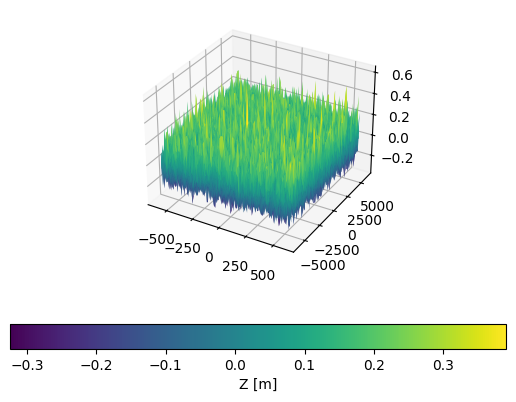

In [15]:
fig = plt.figure(num=1); plt.clf()
ax = fig.add_subplot(111, projection='3d')

# Delaunay triangulation in 2D (x,y); trisurf with z
tri = mtri.Triangulation(PosT[:, 0], PosT[:, 1])
surf = ax.plot_trisurf(tri, PosT[:, 2], linewidth=0.0, antialiased=True, cmap='viridis')
cbar = plt.colorbar(surf, ax=ax, orientation='horizontal', pad=0.15)
cbar.set_label('Z [m]')
